In [1]:
import skimage
import skimage.io as io
import matplotlib.pyplot as plt
import numpy as np
import math
from sklearn.metrics import mean_squared_error as mse

%matplotlib inline
import random
from random import randint
import skimage.transform as tf

In [2]:
def show_images(images):
    plt.figure(figsize=(20, 20))
    for i in xrange(len(images)):
        plt.subplot(1, len(images), i + 1)
        plt.imshow(images[i])
    plt.show()

def load_and_split(filename):
    img = io.imread(filename).astype('float64')
    height = img.shape[0] - img.shape[0] % 3
    return np.split(img[:height, :], 3)

def cut_border(images):
    cut_height = images[0].shape[1] / 20 
    cut_width = images[0].shape[1] / 20
    
    cut_off = max(cut_height, cut_width)
    
    cut_images = []
    for img in images:
        cut_images.append(img[cut_off + 10: -cut_off - 5, cut_off + 10: -cut_off - 5])
    return cut_images

def cross_correlation(img1, img2):
    star =  np.sum(img1 * img2) / (np.sqrt(np.sum(img1 * img1) * np.sum(img2 * img2)))
    return star

def move(img, move_x, move_y):
    height = img.shape[0]
    width = img.shape[1]
    new_img = 1 - np.zeros((height, width))
    if move_x > 0 and move_y > 0:
        new_img[move_x:, move_y:] = img[:-move_x, :-move_y]
    if move_x > 0 and move_y < 0:
        new_img[move_x:, :move_y] = img[:-move_x, :move_y]
    if move_x < 0 and move_y < 0:
        new_img[:move_x, :move_y] = img[-move_x:, :move_y]
    if move_x < 0 and move_y > 0:
        new_img[:move_x, move_y:] = img[-move_x:, :-move_y]
    if move_x == 0 and move_y > 0:
        new_img[:, move_y:] = img[:, :-move_y]
    if move_x == 0 and move_y < 0:
        new_img[:, :move_y] = img[:, :move_y]
    if move_x > 0 and move_y == 0:
        new_img[move_x:, :] = img[:-move_x, :]
    if move_x < 0 and move_y == 0:
        new_img[:move_x, :] = img[-move_x:, :]
    if move_x == 0 and move_y == 0:
        return img
    return new_img

def move_one_on_other(img1, img2, move_x, move_y):
    if move_x > 0 and move_y > 0:
        return img1[move_x:, move_y:], img2[:-move_x, :-move_y]
    if move_x > 0 and move_y < 0:
        return img1[move_x:, :move_y], img2[:-move_x, :move_y]
    if move_x < 0 and move_y < 0:
        return img1[:move_x, :move_y], img2[-move_x:, :move_y]
    if move_x < 0 and move_y > 0:
        return img1[:move_x, move_y:], img2[-move_x:, :-move_y]
    if move_x == 0 and move_y > 0:
        return img1[:, move_y:], img2[:, :-move_y]
    if move_x == 0 and move_y < 0:
        return img1[:, :move_y], img2[:, :move_y]
    if move_x > 0 and move_y == 0:
        return img1[move_x:, :], img2[:-move_x, :]
    if move_x < 0 and move_y == 0:
        return img1[:move_x, :], img2[-move_x:, :]
    if move_x == 0 and move_y == 0:
        return img1, img2

In [5]:
import time


def find_best_move_mse(img1, img2, move_x_range=range(-16, 16), move_y_range=range(-16, 16)):
    min_mse = 100000
    best_move_x = move_x_range[0]
    best_move_y = move_y_range[0]
    for move_x in move_x_range:
        for move_y in move_y_range:
            intersection = move_one_on_other(img1, img2, move_x, move_y)
            height = intersection[0].shape[0]
            width = intersection[0].shape[1]
            cur_mse = mse(intersection[0], intersection[1]) / (height * width)
            #print move_x, move_y, cur_mse
            if cur_mse < min_mse:
                min_mse = cur_mse
                best_move_x = move_x
                best_move_y = move_y
                
    return best_move_x, best_move_y


def find_best_move_correlation(img1, img2, move_x_range=range(-16, 16), move_y_range=range(-16, 16)):
    max_correlation = 0
    best_move_x = move_x_range[0]
    best_move_y = move_y_range[0]
    for move_x in move_x_range:
        for move_y in move_y_range:
            intersection = move_one_on_other(img1, img2, move_x, move_y)
            cur_correlation = cross_correlation(intersection[0], intersection[1])
            #print move_x, move_y, cur_mse
            if cur_correlation > max_correlation:
                max_correlation = cur_correlation
                best_move_x = move_x
                best_move_y = move_y
                
    return best_move_x, best_move_y


def pyramide_best_move(img1, img2, move_x_range=1, move_y_range=1, cut_off=16, metrics='mse'):
    height = img1.shape[0]
    width = img1.shape[1]
    
    if height < 500 and width < 500:
        if metrics == 'mse':
            best_move = find_best_move_mse(img1, img2)
        elif metrics == 'corr':
            best_move = find_best_move_correlation(img1, img2)
        move_x_range = 0
        move_y_range = 0
    else:
        best_move = map(lambda x: 2 * x, pyramide_best_move(tf.resize(img1, (height / 2, width / 2)),
                        tf.resize(img2, (height / 2, width / 2)), move_x_range * 2, move_y_range * 2,  cut_off / 2))
    best_move_x = best_move[0]
    best_move_y = best_move[1]
    if metrics == 'mse':
        return find_best_move_mse(img1, img2, range(best_move_x - move_x_range, best_move_x + move_x_range + 1),
                              range(best_move_y - move_y_range, best_move_y + move_y_range + 1))
    elif metrics == 'corr':
        return find_best_move_correlation(img1, img2, range(best_move_x - move_x_range, best_move_x + move_x_range + 1),
                              range(best_move_y - move_y_range, best_move_y + move_y_range + 1))
    
                                      
    
def match_channels(imgs, move1, move2):
    height, width = imgs[0].shape[0], imgs[0].shape[1]
    color_img = np.ndarray(shape=(height, width, 3), dtype='float64')
    color_img[:, :, 2] = imgs[0]
    color_img[:, :, 1] = move(imgs[1], move1[0], move1[1])
    color_img[:, :, 0] = move(imgs[2], move2[0], move2[1])
    return color_img, move1, move2


def align(img_filename):
    start_time = time.time()
    imgs = load_and_split(img_filename)
    cut_imgs = cut_border(imgs)
    #show_images(cut_imgs)
    move1 = pyramide_best_move(cut_imgs[0], cut_imgs[1])
    move2 = pyramide_best_move(cut_imgs[0], cut_imgs[2])
    color_img1 = match_channels(cut_imgs, move1, move2)[0] / 255

    move3 = pyramide_best_move(cut_imgs[0], cut_imgs[1], metrics='corr')
    move4 = pyramide_best_move(cut_imgs[0], cut_imgs[2], metrics='corr')
    
    print 'mse best move: {0}, {1}'.format(move1, move2)
    print 'correlation best move: {0}, {1}'.format(move3, move4)
    
    #print color_img1.shape
    color_img2 = match_channels(cut_imgs, move3, move4)[0] / 255
    if color_img1.shape[0] > 500:
        cut_off = 100
    else:
        cut_off = 15
    
    print('run time: {0} sec'.format((time.time() - start_time)))
    
    return [color_img1[cut_off: , cut_off: ], color_img2[cut_off:, cut_off:]]

# Small pictures test##

mse best move: (5, 1), (9, 4)
correlation best move: (5, 1), (9, 4)
run time: 4.55166101456 sec


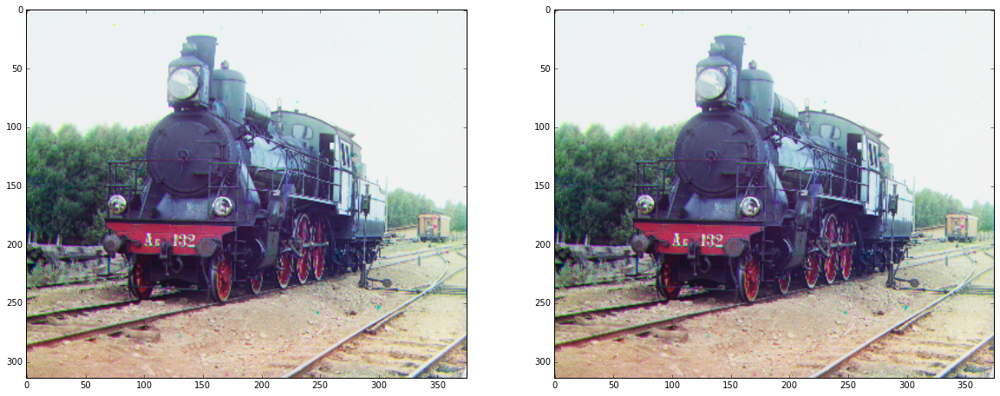

mse best move: (8, 5), (15, 7)
correlation best move: (8, 5), (15, 7)
run time: 4.24565291405 sec


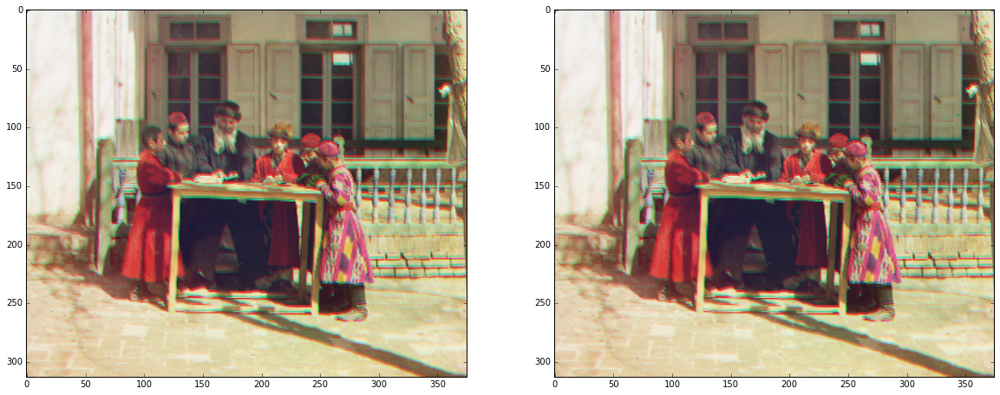

mse best move: (6, 3), (6, 5)
correlation best move: (6, 3), (8, 5)
run time: 4.25716710091 sec


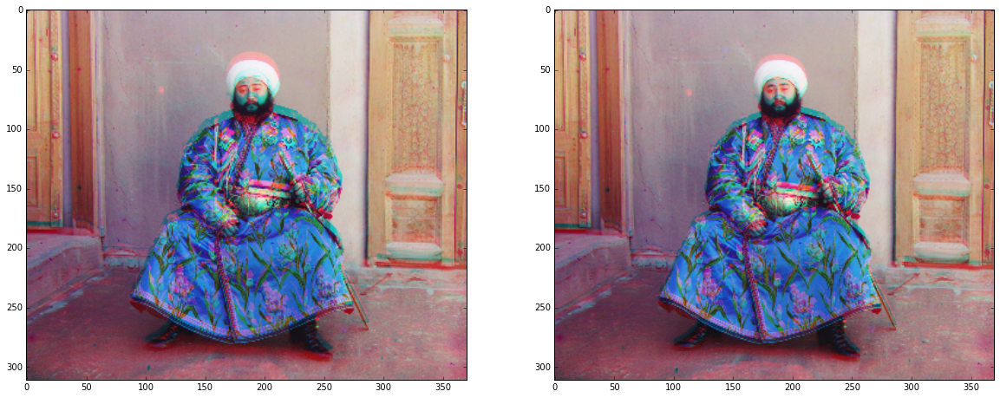

mse best move: (5, 3), (12, 5)
correlation best move: (5, 3), (12, 5)
run time: 4.75159096718 sec


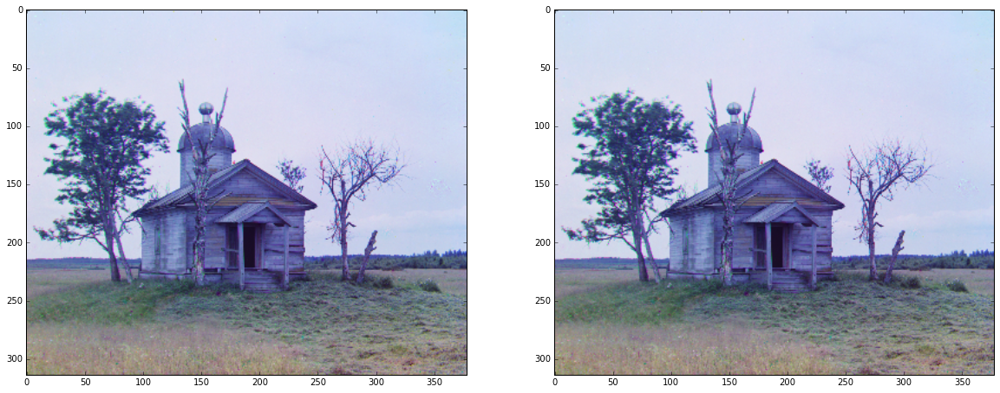

mse best move: (-2, 1), (1, 2)
correlation best move: (-2, 1), (1, 2)
run time: 4.44768810272 sec


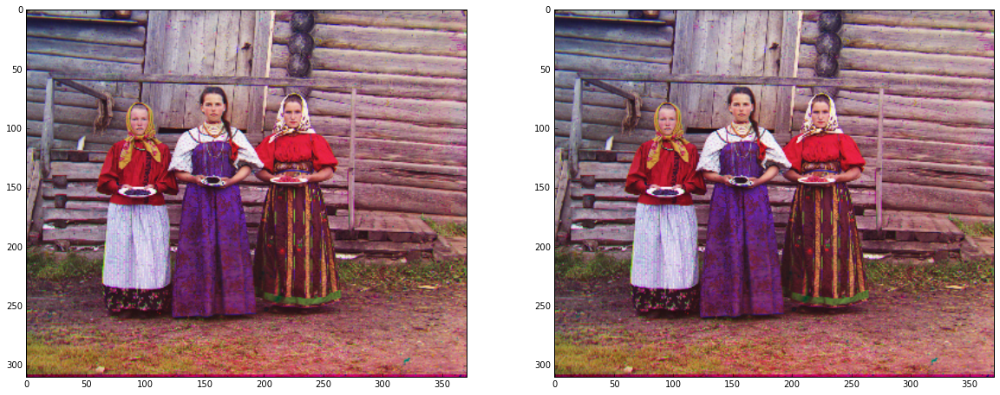

mse best move: (3, 1), (10, 1)
correlation best move: (3, 1), (10, 1)
run time: 3.54471802711 sec


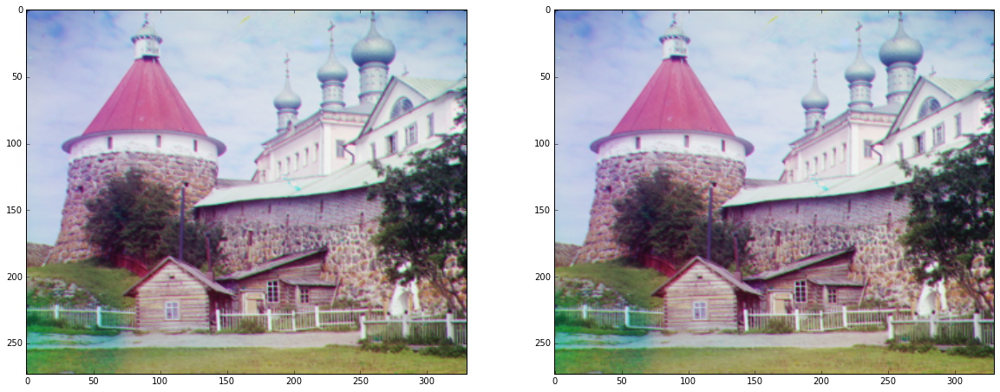

mse best move: (3, 2), (8, 4)
correlation best move: (3, 2), (8, 4)
run time: 4.58950996399 sec


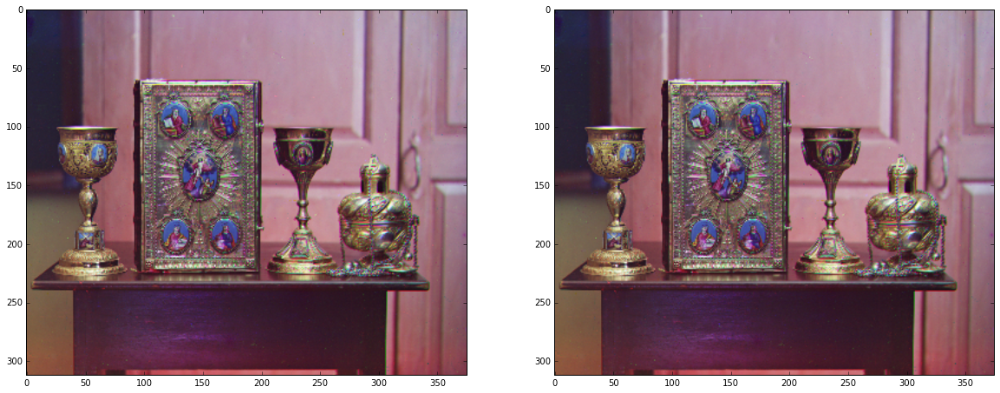

CPU times: user 38 s, sys: 356 ms, total: 38.4 s
Wall time: 38.5 s


In [6]:
%%time

import glob
import os

for img in glob.glob(os.path.join('small', '*.png')):
    show_images(align(img)) 

# Big pictures test

mse best move: (42, 6), (87, 32)
correlation best move: (42, 6), (87, 32)
run time: 13.8707480431 sec


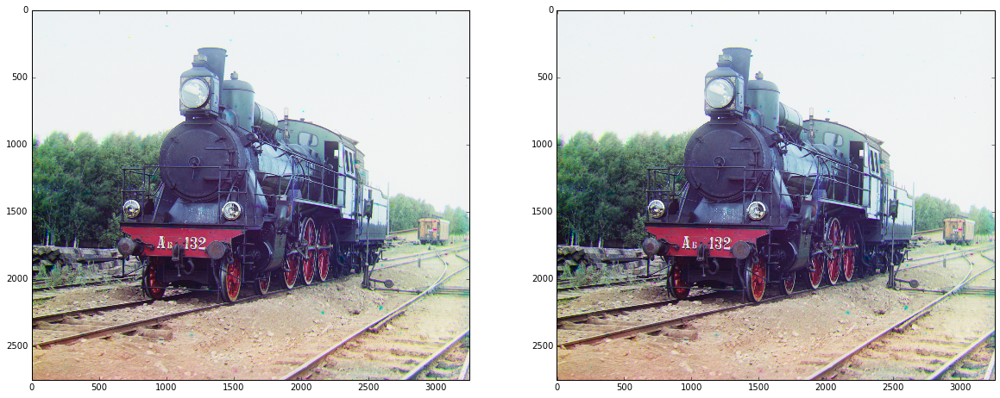

mse best move: (71, 39), (141, 62)
correlation best move: (71, 39), (141, 62)
run time: 14.2021970749 sec


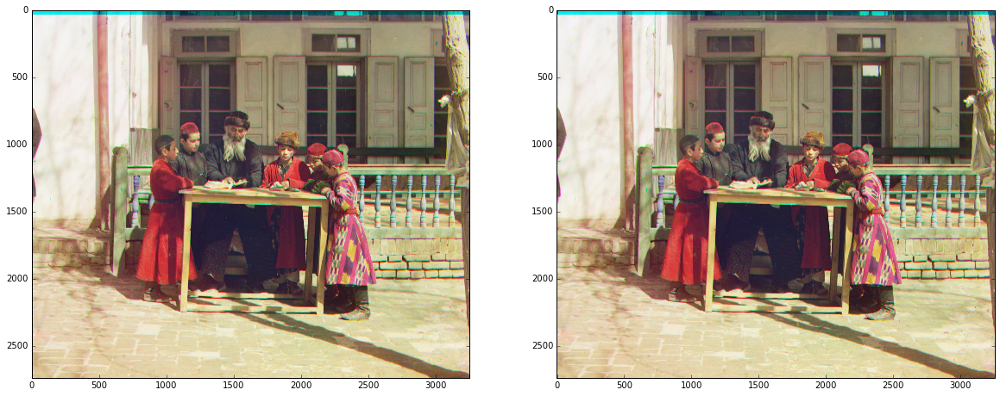

mse best move: (49, 24), (57, 43)
correlation best move: (49, 24), (57, 44)
run time: 14.430123806 sec


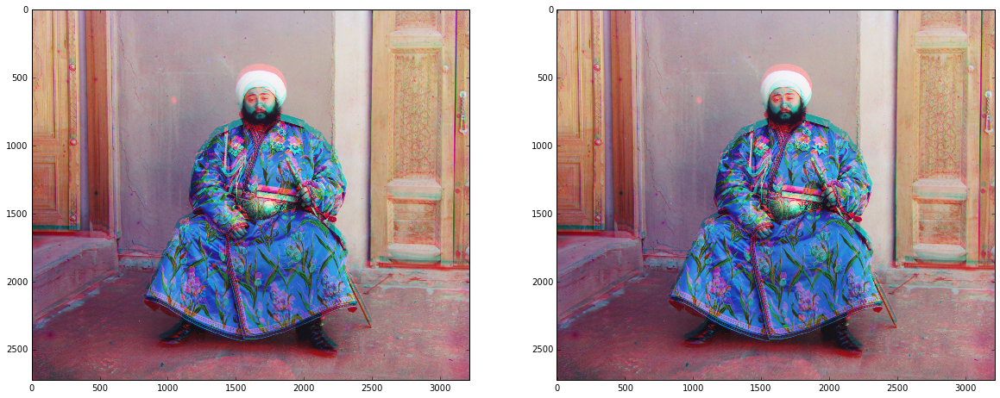

mse best move: (45, 21), (105, 43)
correlation best move: (45, 21), (105, 43)
run time: 14.9556398392 sec


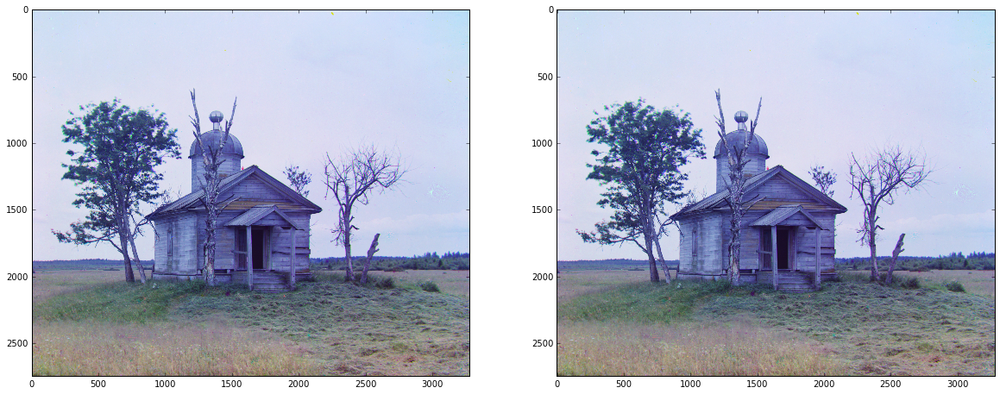

mse best move: (-17, 10), (10, 17)
correlation best move: (-17, 10), (10, 17)
run time: 14.4236569405 sec


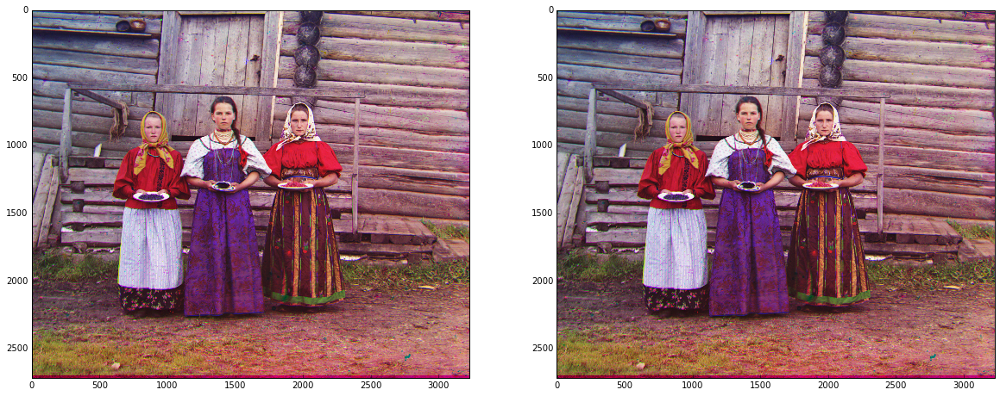

mse best move: (28, 5), (104, 11)
correlation best move: (28, 5), (104, 11)
run time: 14.8442249298 sec


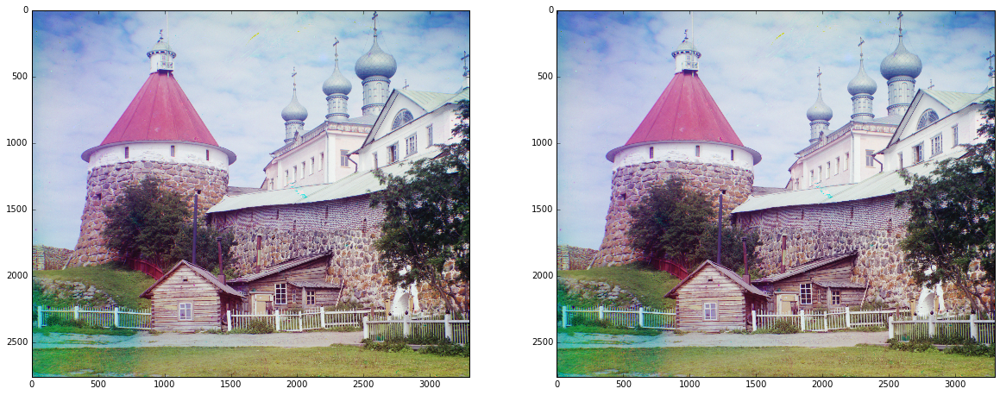

mse best move: (24, 20), (72, 33)
correlation best move: (24, 20), (72, 33)
run time: 13.7564480305 sec


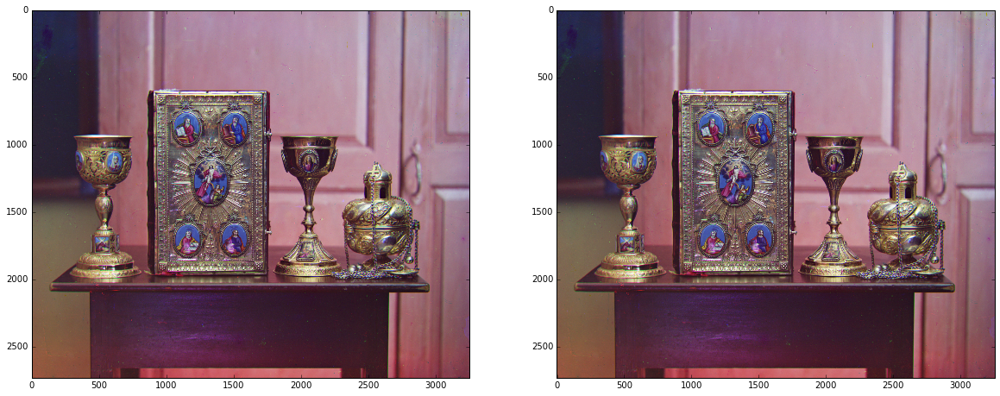

CPU times: user 1min 48s, sys: 7.31 s, total: 1min 55s
Wall time: 1min 56s


In [7]:
%%time

import glob
import os

for img in glob.glob(os.path.join('big', '*.png')):
    show_images(align(img)) 

На больших картинках качество заметно улучшилось, например картинка с Толстым стала очень четкой. Однако бухарский эмир все равно остался довольно размытым, возможно, из-за заметных пятен на разных каналах.